<a href="https://colab.research.google.com/github/shreyasat27/Humans-vs-Quantum-Computers---IBM/blob/main/1_network_analysis.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Part 1. Notebook for Network and Topological Analysis in Neuroscience

Authors: Eduarda Centeno & Fernando Santos

With this notebook, we would like to facilitate the computation of different metrics in Network and Topological analysis in neuroscience. Our goal is to cover both standard Graph Theory and a few Topological & Geometric data analysis metrics.

We will not include any step regarding preprocessing of imaging data. The resting state fMRI (rsfMRI) matrices used here (i.e., based in correlation values of time series) were obtained from the [The UCLA multimodal connectivity database](http://umcd.humanconnectomeproject.org/) (1000_Functional_Connectomes dataset - references [1-2]). Nevertheless, one can adapt and use the scripts here provided to networks based in other imaging modalities.

## Table of contents
1. [Imports](#imports)
2. [Importing data & the connectivity matrix](#importing-data)
3. [Graph Theory](#graph-theory)
4. [Topology & Geometry](#TDA)
5. [References](#references)
6. [Acknowledgements](#acknowledgements)

<a id='imports'></a>
###  **1.** Imports
#### Let's start with the necessary packages for the following computations:

In [6]:
# Basic data manipulation and visualisation libraries
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd
import glob

# Network Libraries
import networkx as nx
from nxviz import CircosPlot
import community

# Libraries used for Topological Data Analysis
import gudhi

# Magic command to change plotting backend
#%matplotlib qt

# Magic command to load watermark
%load_ext watermark

ModuleNotFoundError: ignored

In [29]:
!pip install -r /content/network_TDA_tutorial/requirements.txt


Obtaining nxviz from git+https://****@github.com/eduardacenteno/nxviz#egg=nxviz (from -r /content/network_TDA_tutorial/requirements.txt (line 8))
  Updating ./src/nxviz clone
  Running command git fetch -q --tags
  Running command git reset --hard -q 5c42822a2930ee3012921277326cf9602602da63
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 3.0/3.0 MB 8.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 134.3/134.3 kB 12.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.0/1.0 MB 15.3 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 5.4/5.4 MB 5.8 MB/s eta 0:00:00
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  error: subprocess-exited-with-error
  
  × Preparing metadata (pyproject.toml) did not run successfully.
  │ exit code: 1
  ╰─> See above for output.
  
  note: This error origina

In [43]:
!pip install community

In [2]:
!git clone https://github.com/multinetlab-amsterdam/network_TDA_tutorial/

Cloning into 'network_TDA_tutorial'...
remote: Enumerating objects: 1074, done.
remote: Counting objects: 100% (221/221), done.
remote: Compressing objects: 100% (138/138), done.
remote: Total 1074 (delta 113), reused 141 (delta 72), pack-reused 853
Receiving objects: 100% (1074/1074), 207.15 MiB | 14.99 MiB/s, done.
Resolving deltas: 100% (115/115), done.
Updating files: 100% (843/843), done.


In [4]:
# Possibility to stop warnings
import warnings

warnings.filterwarnings('ignore')

In [8]:
# Print versions
!watermark --author "Eduarda & Fernando" --date --time --python --machine --iversion --watermark --packages community,meshio,plotly,scipy,scikit-learn,jupyterlab,notebook

/bin/bash: line 1: watermark: command not found


<a id='importing-data'></a>
### **2.** Importing data & the connectivity matrix
#### Now we will start working with the brain data.
Here, we will try to cover both computation and some theoretical background/key points on each section.
Our first step will be on how to import the matrix data:

In [12]:
matrix = np.genfromtxt('/content/network_TDA_tutorial/1000_Functional_Connectomes/Connectivity matrices/AveragedMatrix.txt')

##################################################################################################
##### **Here we'll make available the computation on how to compute the average matrix, but to make it faster, we'll work with the file that we already saved.**
The idea here is to get an average matrix from all matrices available. For that, different methods can be used. We'll show two common ones: one with pandas, another with Numpy.

In [18]:
# Importing all matrices to generate averaged data with Numpy or Pandas
matrices = [np.genfromtxt(file) for file in glob.glob('/content/network_TDA_tutorial/1000_Functional_Connectomes/Connectivity matrices/*_matrix_file.txt')]
matricesP = [pd.read_csv(file, header = None, delim_whitespace=True) for file in glob.glob('/content/network_TDA_tutorial/1000_Functional_Connectomes/Connectivity matrices/*_matrix_file.txt')]

# Averaging matrices with Numpy
MatAv = np.zeros(shape=matrices[0].shape)
for matrix in matrices:
    MatAv += matrix

matrix = MatAv/len(matrices)

# Averaging matrices with Pandas
Pdmatrix = pd.concat(matricesP).groupby(level=0).mean()

In [16]:
matrices

[array([[ 0.        , -0.21845114, -0.24911939, ...,  0.29613583,
         -0.09894677,  0.21187832],
        [-0.21845114,  0.        ,  0.29740188, ..., -0.17761349,
         -0.10701958, -0.10972058],
        [-0.24911939,  0.29740188,  0.        , ..., -0.0840611 ,
         -0.05773053, -0.07271664],
        ...,
        [ 0.29613583, -0.17761349, -0.0840611 , ...,  0.        ,
         -0.01612327,  0.39003248],
        [-0.09894677, -0.10701958, -0.05773053, ..., -0.01612327,
          0.        , -0.39585209],
        [ 0.21187832, -0.10972058, -0.07271664, ...,  0.39003248,
         -0.39585209,  0.        ]]),
 array([[ 0.        , -0.2719211 , -0.19051542, ...,  0.16612549,
          0.19407136, -0.09252341],
        [-0.2719211 ,  0.        ,  0.29102791, ..., -0.20644793,
         -0.10149759,  0.0054212 ],
        [-0.19051542,  0.29102791,  0.        , ..., -0.05262694,
          0.17337792,  0.21601263],
        ...,
        [ 0.16612549, -0.20644793, -0.05262694, ...,  

##################################################################################################

#####  **Let´s obtain the region names and subnetwork information**

In [21]:
# Obtaining name of areas according to matching file
lineList = [line.rstrip('\n') for line in open('/content/network_TDA_tutorial/1000_Functional_Connectomes/Region Names/Baltimore_5560_region_names_abbrev_file.txt')]

# Obtaining a random list of numbers to simulate subnetworks -- THESE NUMBERS DO NOT CORRESPOND TO ANY REAL CLASSIFICATION
sublist = [line.rstrip('\n') for line in open('/content/network_TDA_tutorial/subnet_ordernames.txt')]

# Obtaining a random list of colors that will match the random subnetwork classification for further graphs -- THESE COLORNAMES DO NOT CORRESPOND TO ANY REAL CLASSIFICATION
colorlist = [line.rstrip('\n') for line in open('/content/network_TDA_tutorial/subnet_order_colors.txt')]

# Obtaining a random list of colors (in numbers) that will match the random subnetwork classification for further graphs -- THESE NUMBERS DO NOT CORRESPOND TO ANY REAL CLASSIFICATION
colornumbs = np.genfromtxt('/content/network_TDA_tutorial/subnet_colors_number.txt')

#####  **Important!!**
Have a look at the following files to check if they match your matrix's regions/subnets. If not, you will have to create your own files:

    a. *_region_names_abbrev.txt
    b. *_region_names_full_file.txt
    c. subnet_colors_number.txt
    d. subnet_ordernames.txt
    e. subnet_order_colors.txt
    f. HCP_positions.txt
    
If you are working with matrices that had regions removed (low signal, tumor mask, etc.), you will have to adapt the notebook (or the base files) to take that into account. We provide code snippet (removing_regions.py in Background Scripts) which will help you with that. How to proceed (2 options):

    a. You can just copy the function in removing_regions.py (starting at ln 22) and paste it under this cell. That will allow you to correct ineList, sublist, colorlist, colornumbs according to the regions that should be removed.
    b. If the same regions were removed for all your matrices, you can also just correct the files listed above and erase the regions you won't use.
    c. For 2-visualization_3d.ipynb visualizations, we are adapting the functions to accept option (a) (Not ready yet). However, if you choose to proceed with (b), this will also work for 2-visualization_3d.ipynb, since the chages will be in the base files (which are called by HCP_Data_Vis.py)
    
*Important*: the final lineList, sublist, colorlist, colornumbs must have the same length as your matrix!

##################################################################################################

#### Now, let's use Seaborn's heatmap to plot correlation matrix:
After importing the matrix, we can start with a standard representation - heatmaps!

In [22]:
# Creating a DataFrame which will have the rows and column names according to the brain areas
matrixdiagNaN = matrix.copy()
np.fill_diagonal(matrixdiagNaN,np.nan)
Pdmatrix = pd.DataFrame(matrixdiagNaN)
Pdmatrix.columns = lineList
Pdmatrix.index = lineList
Pdmatrix = Pdmatrix.sort_index(0).sort_index(1)

##### Here is our Heatmap!

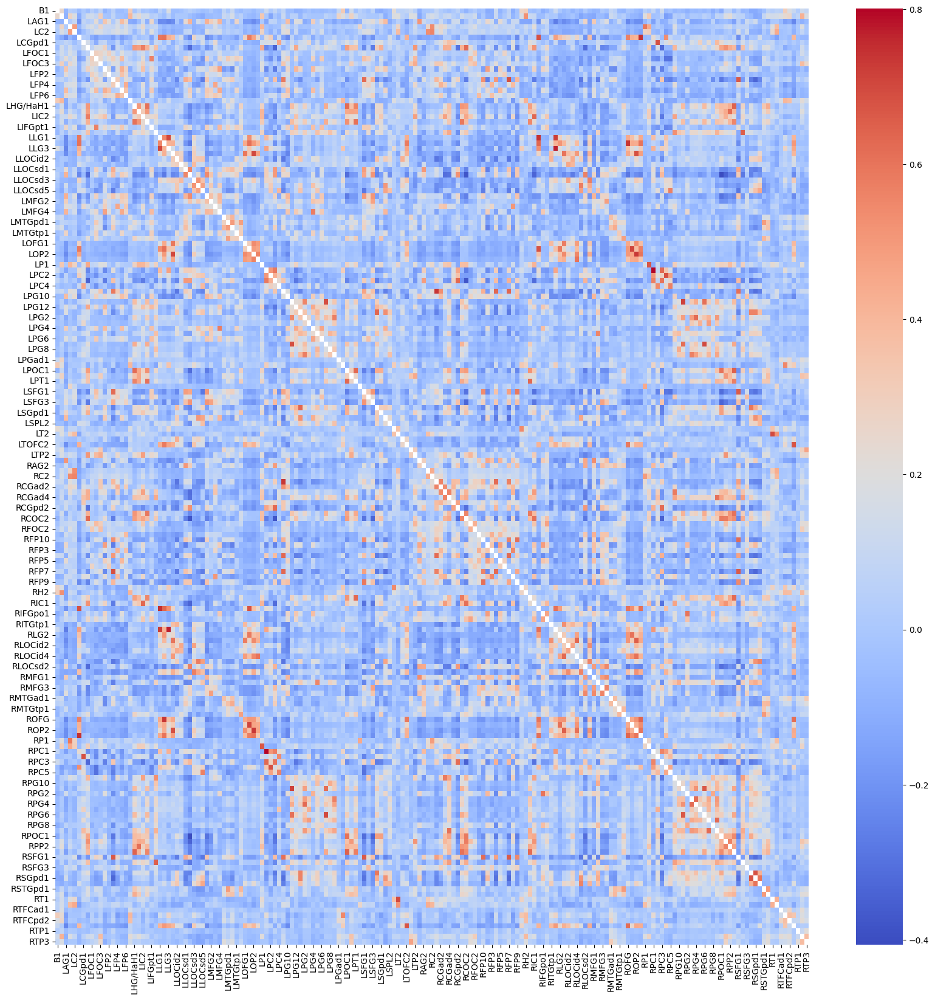

In [23]:
# This mask variable gives you the possibility to plot only half of the correlation matrix.
mask = np.zeros_like(Pdmatrix.values, dtype=np.bool)
mask[np.triu_indices_from(mask)] = True

plt.figure(figsize = (20, 20))
_ = sns.heatmap(Pdmatrix, cmap='coolwarm', cbar=True, square=False, mask=None) # To apply the mask, change to mask=mask

##### **Key point:**
When working with network analysis in brain data, a couple of crucial decisions have to be made.
For example, one can decide to use all network connections - including low-weight links (sometimes considered spurious connections), or establish an arbitrary threshold and keep only links above a specific correlation value. This step can be done in different ways, based solely on the correlation threshold (as done here), or based on network density (i.e., you keep only the 20% strongest correlations).
If using an arbitrary threshold, it is also possible to define if the resulting matrix will be weighted (i.e., keeping the edges' weight), or unweighted (binarised matrices).

Another point of discussion is how to deal with negative weights in weighted networks. A common practice is to absolutise the matrix and preserve the topology. This approach also facilitates the computation of several metrics from graph theory that are not adapted for negative weights.
Here, we have chosen to proceed by using the absolute of all connections in the correlation matrix.

*We strongly suggest Reference [3] for a deeper understanding on all these decisions.*

Figure 1 provides a schematic summary of the types of networks:

![matrices.jpg](attachment:matrices.jpg)

Figure 1. Types of networks. (A) A binary directed graph. (B) Binary, undirected graph. In binary graphs, the presence of a connection is signified by a 1 or 0 otherwise. (C) A representation of graph F as a network of brain areas. (D) A weighted, directed graph. (F) A weighted, undirected graph. In a weighted graph, the strength of the connections is represented by a number [0,1]. (G) A connectivity matrix of C and F. Source: Part of the image was obtained from [Smart Servier Medical Art](https://smart.servier.com/).

In [24]:
# Absolutise for further user
matrix = abs(matrix)
matrixdiagNaN = abs(matrixdiagNaN)

##### **Key point:**
When working with fMRI brain network data, it is useful to generate some plots (e.g., the heatmaps above for matrix visualisation, and distribution plots of edge weights) to facilitate data comprehension and flag potential artefacts. In brain networks, we expect mostly weak edges and a smaller proportion of strong ones. When plotted as a probability density of log10, we expect the weight distribution to have a Gaussian-like form [3].

[Text(0.5, 0, 'log(weights)')]

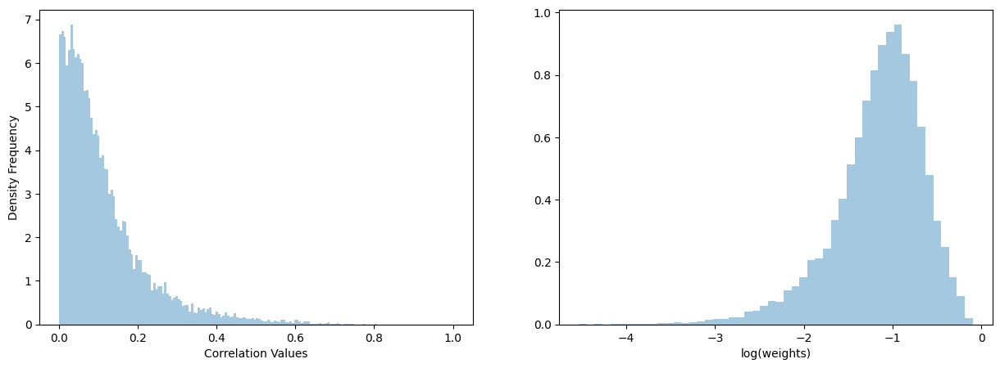

In [25]:
# Weight distribution plot
bins = np.arange(np.sqrt(len(np.concatenate(matrix))))
bins = (bins - np.min(bins))/np.ptp(bins)
fig, axes = plt.subplots(1,2, figsize=(15,5))

# Distribution of raw weights
rawdist = sns.distplot(matrixdiagNaN.flatten(), bins=bins, kde=False, ax=axes[0], norm_hist=True)
rawdist.set(xlabel='Correlation Values', ylabel = 'Density Frequency')

# Probability density of log10
log10dist = sns.distplot(np.log10(matrixdiagNaN).flatten(), kde=False, ax=axes[1], norm_hist=True)
log10dist.set(xlabel='log(weights)')

<a id='graph-theory'></a>
### **3.**  Graph Theory
#### From now, we will start working with some standard Graph Theory metrics.
The metrics that we will cover here are:
- Density
- Degree/Strength -  *the word degree is commonly used for binary graphs, whereas strength tends to be used for weighted networks. (Reference [1] - Chapter 4)*
- Centrality: Eigenvector, Betweenness, Closeness, Degree, Page Rank
- Path length
- Modularity
- Assortativity
- Clustering coefficient

##### **Key point:**
Each of these metrics has its requisites for computation. For example, it is not possible to accurately compute closeness centrality and the average shortest path for fragmented networks (i.e., there are subsets of disconnected nodes). Therefore, keep that in mind when thinking about thresholding a matrix.

Figure 2 provides a summary of some graph-theoretical metrics:

![GT.jpg](attachment:GT.jpg)
Figure 2. Graph theoretical metrics. (A) A representation of a graph indicating centralities. (B) Representation of modularity and clustering coefficient. (C) The shortest path between vertices A and B. (D) The minimum spanning tree.

##### We will start by creating the graph and removing its self-loops (i.e., a connection of a node with itself).

In [31]:
# Creating a graph

G = nx.from_numpy_array(matrix)

# Removing self-loops
G.remove_edges_from(list(nx.selfloop_edges(G)))

##### Now, we compute the network's density.


<u>Definition</u>:
 A graph's density is the ratio between the number of edges and the total number of possible edges.

Clearly, in all-to-all connected graphs, the density will be maximal (or 1), whereas for a graph without edges it will be 0. Here, just for the sake of demonstration, we will compute the density of different states of the network to show how density changes.

In [33]:
#print(nx.density.__doc__)

# Create graphs for comparison
matrix2 = matrix.copy()
matrix3 = matrix.copy()

# Create sparser graphs
matrix2[matrix2<=0.50] = 0
matrix3[matrix3<=0.75] = 0

st50G = nx.from_numpy_array(matrix2)
st25G = nx.from_numpy_array(matrix3)

st50G.remove_edges_from(list(nx.selfloop_edges(st50G)))
st25G.remove_edges_from(list(nx.selfloop_edges(st25G)))

# Compute densities
alltoall = nx.density(G)
st50 = nx.density(st50G)
st25 = nx.density(st25G)

names = ['All-To-All', '> 0.5', '> 0.75']
values = [alltoall, st50, st25]

dict(zip(names, values))

{'All-To-All': 1.0,
 '> 0.5': 0.013161273754494093,
 '> 0.75': 0.00012840267077555214}

##### Now, we compute the nodal degree/strength.

<u>Definition</u>: In undirected weighted networks the node strength can be computed as the sum of the connectivity weights of the edges attached to each node. It is a primary metric to identify how important is a node in the graph.
It is possible to apply a normalization (divide the weights by 1/N-1) to make the output value more intuitive. (Reference [3] pg. 119)  

In degree computation, it is also common to compute the mean degree of the network, which is the sum of node degrees divides by the total number of nodes.

In [34]:
# Computation of nodal degree/strength
#print(nx.degree.__doc__)

strength = G.degree(weight='weight')
strengths = {node: val for (node, val) in strength}
nx.set_node_attributes(G, dict(strength), 'strength') # Add as nodal attribute

# Normalized node strength values 1/N-1
normstrenghts = {node: val * 1/(len(G.nodes)-1) for (node, val) in strength}
nx.set_node_attributes(G, normstrenghts, 'strengthnorm') # Add as nodal attribute

# Computing the mean degree of the network
normstrengthlist = np.array([val * 1/(len(G.nodes)-1) for (node, val) in strength])
mean_degree = np.sum(normstrengthlist)/len(G.nodes)
print(mean_degree)

0.11425288701460302


##### Next, we will compute the centralities!

Centralities are frequently used to understand which nodes occupy critical positions in the network.

Remember:
- Degree Centrality: The degree centrality for a node **v** is the fraction of nodes it is connected to. This metric is the same as node degree, so it will not be computed again. (NetworkX Documentation [4])

- Closeness Centrality: In weighted graphs, the closeness centrality of a node __v__ is the reciprocal of the sum of the shortest weighted path distances from **v** to all *N-1* other nodes. An important thing to think about this metric is that a node with many low weight edges can have the same centrality as a node with only a few high-weighted edges. (NetworkX Documentation, Reference [3] - Chapter 5)

- Betweenness Centrality: Betweenness centrality of a node **v** is the sum of the fraction of all-pairs shortest paths that pass through __v__. (NetworkX Documentation [4])

- Eigenvector Centrality: Eigenvector centrality computes the centrality for a node based on its neighbours' centrality. It takes into account not only quantity (e.g., degree centrality) but also quality. If a node is linked to many nodes that also display a high degree, that node will have high eigenvector centrality. (NetworkX Documentation)

- Page Rank: PageRank computes a ranking of the nodes in the graph G based on the incoming links' structure. (NetworkX Documentation [4])

Text(0, 0.5, 'Counts')

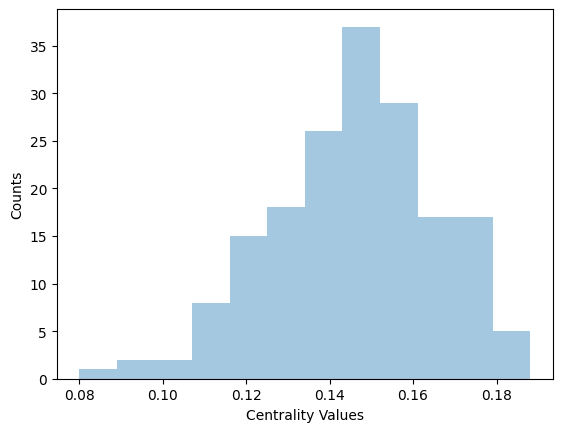

In [35]:
# Closeness centrality
#print(nx.closeness_centrality.__doc__)

# The function accepts a argument 'distance' that, in correlation-based networks, must be seen as the inverse ...
# of the weight value. Thus, a high correlation value (e.g., 0.8) means a shorter distance (i.e., 0.2).
G_distance_dict = {(e1, e2): 1 / abs(weight) for e1, e2, weight in G.edges(data='weight')}

# Then add them as attributes to the graph edges
nx.set_edge_attributes(G, G_distance_dict, 'distance')

# Computation of Closeness Centrality
closeness = nx.closeness_centrality(G, distance='distance')

# Now we add the closeness centrality value as an attribute to the nodes
nx.set_node_attributes(G, closeness, 'closecent')

# Visualise  values directly
#print(closeness)

# Closeness Centrality Histogram
sns.distplot(list(closeness.values()), kde=False, norm_hist=False)
plt.xlabel('Centrality Values')
plt.ylabel('Counts')

Text(0, 0.5, 'Counts')

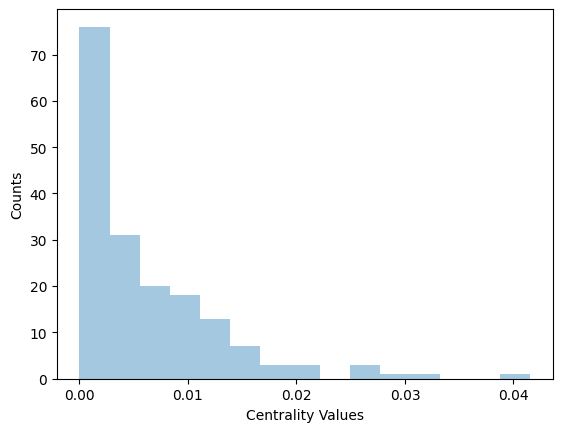

In [36]:
# Betweenness centrality:
#print(nx.betweenness_centrality.__doc__)
betweenness = nx.betweenness_centrality(G, weight='distance', normalized=True)

# Now we add the it as an attribute to the nodes
#nx.set_node_attributes(G, betweenness, 'bc')

# Visualise  values directly
#print(betweenness)

# Betweenness centrality Histogram
sns.distplot(list(betweenness.values()), kde=False, norm_hist=False)
plt.xlabel('Centrality Values')
plt.ylabel('Counts')

Text(0, 0.5, 'Counts')

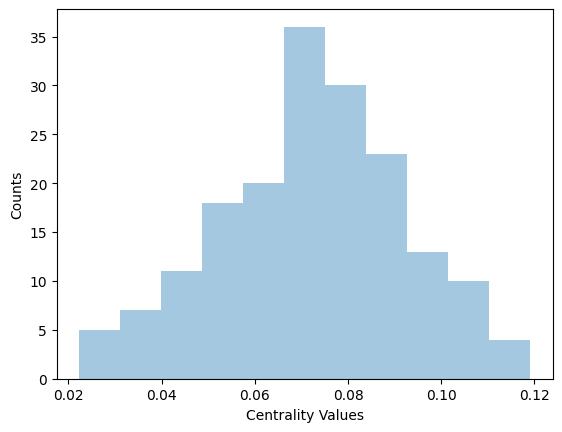

In [37]:
# Eigenvector centrality
#print(nx.eigenvector_centrality.__doc__)
eigen = nx.eigenvector_centrality(G, weight='weight')

# Now we add the it as an attribute to the nodes
nx.set_node_attributes(G, eigen, 'eigen')

# Visualise  values directly
#print(eigen)

# Eigenvector centrality Histogram
sns.distplot(list(eigen.values()), kde=False, norm_hist=False)
plt.xlabel('Centrality Values')
plt.ylabel('Counts')

Text(0, 0.5, 'Counts')

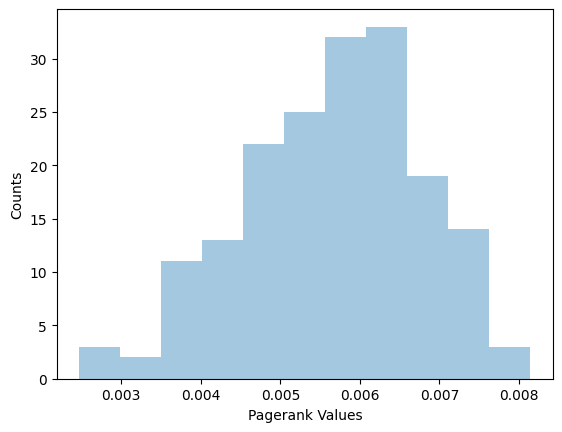

In [38]:
# Page Rank
#print(nx.pagerank.__doc__)
pagerank = nx.pagerank(G, weight='weight')

# Add as attribute to nodes
nx.set_node_attributes(G, pagerank, 'pg')

# Visualise values directly
#print(pagerank)

# Page Rank Histogram
sns.distplot(list(pagerank.values()), kde=False, norm_hist=False)
plt.xlabel('Pagerank Values')
plt.ylabel('Counts')

##### Now, let's move on to the Path Length!

- Shortest Path:  The shortest path (or distance) between two nodes in a graph. In a weighted graph it is obtained by the minimum sum of weights.

- Average Path Length: It is a concept in network topology that is defined as the average number of steps along the shortest paths for all possible pairs of network nodes. It is a measure of the efficiency of information or mass transport on a network.

In [39]:
# Path Length
#print(nx.shortest_path_length.__doc__)

# This is a versatile version of the ones below in which one can define or not source and target. Remove the hashtag to use this version.
#list(nx.shortest_path_length(G, weight='distance'))

# This one can also be used if defining source and target:
#print(nx.dijkstra_path_length.__doc__)
nx.dijkstra_path_length(G, source=20, target=25, weight='distance')

# Whereas this one is for all pairs. Remove the hashtag to use this version.
#print(nx.all_pairs_dijkstra_path_length.__doc__)
#list(nx.all_pairs_dijkstra_path_length(G, weight='distance'))

7.816910950773235

In [40]:
# Average Path Length or Characteristic Path Length
#print(nx.average_shortest_path_length.__doc__)
nx.average_shortest_path_length(G, weight='distance')

6.992954715060494

##### Now, modularity, assortativity, clustering coefficient and the minimum spanning tree!

- Modularity: Modularity compares the number of edges inside a cluster with the expected number of edges that one would find if the network was connected randomly but with the same number of nodes and node degrees. It is used to identify strongly connected subsets, i.e., modules or 'communities'. Here, we will use the Louvain algorithm, as recommended in Reference [3].

- Assortativity: Assortativity measures the similarity of connections in the graph with respect to the node degree. (NetworkX)

- Clustering coefficient: a measure of the tendency for any two neighbours of a node to be directly connected. According to Networkx's documentation, weighted graphs' clustering coefficient is defined as the geometric average of the subgraph edge weights. (NetworkX, Reference [4])

- Minimum Spanning Tree: it is the backbone of a network, i.e. the minimum set of edges necessary to ensure that paths exist between all nodes. A few main algorithms are used to build the spanning tree, being the Kruskal's algorithm the one used by NetworkX. Briefly, this algorithm ranks the distance of the edges, adds the ones with the smallest distance first, and by adding edge-by-edge, it checks if cycles are formed or not. The algorithm will not add an edge that results in the formation of a cycle.

In [50]:
# Modularity
#print(community.best_partition.__doc__)
!pip install community
import community.community_louvain as community_louvain
part = community_louvain.best_partition(G, weight='weight')

# Visualise values directly
#print(part)

# Check the number of communities
set(part.values()).union()

{0, 1, 2, 3, 4}

In [51]:
# Assortativity
#print(nx.degree_pearson_correlation_coefficient.__doc__)
nx.degree_pearson_correlation_coefficient(G, weight='weight')

-0.005681818181818176

Text(0, 0.5, 'Counts')

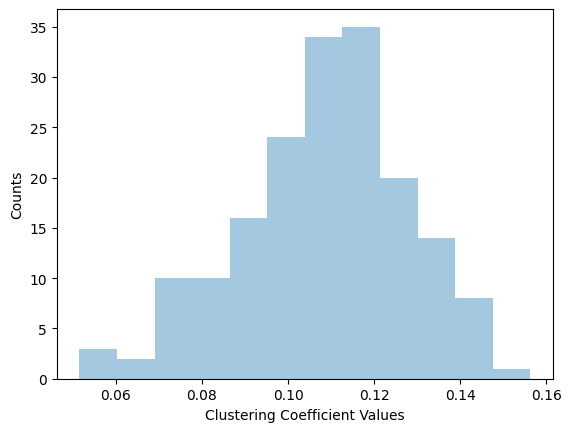

In [52]:
# Clustering Coefficient
#print(nx.clustering.__doc__)
clustering = nx.clustering(G, weight='weight')

# Add as attribute to nodes
nx.set_node_attributes(G, clustering, 'cc')

# Visualise values directly
#print(clustering)

# Clustering Coefficient Histogram
sns.distplot(list(clustering.values()), kde=False, norm_hist=False)
plt.xlabel('Clustering Coefficient Values')
plt.ylabel('Counts')

In [53]:
# Average Clustering Coefficient
#print(nx.clustering.__doc__)
nx.average_clustering(G, weight='weight')

0.10869657391580569

In [54]:
# Minimum Spanning Tree
GMST = nx.minimum_spanning_tree(G, weight='distance')

#### Data Visualisation & Graph Theory
Under this section we we'll provide a few ideas of how to visualise and present your network.

First, let's get some important attributes about brain area names and subnetworks. These will be used later for graphical visualisation!

In [55]:
# Function to transform our list of brain areas into a dictionary
def Convert(lst):
    res_dct = {i : lst[i] for i in range(0, len(lst))}
    return res_dct

# Add brain areas as attribute of nodes
nx.set_node_attributes(G, Convert(lineList), 'area')

# Add node colors
nx.set_node_attributes(G, Convert(colorlist), 'color')

# Add subnetwork attribute
nx.set_node_attributes(G, Convert(sublist), 'subnet')

# Add node color numbers
nx.set_node_attributes(G, Convert(colornumbs), 'colornumb')

Now we will create a standard spring network plot, but this could also be made circular by changing to *draw_circular*.

We defined the edge widths to the power of 2 so that weak weights will have smaller widths.

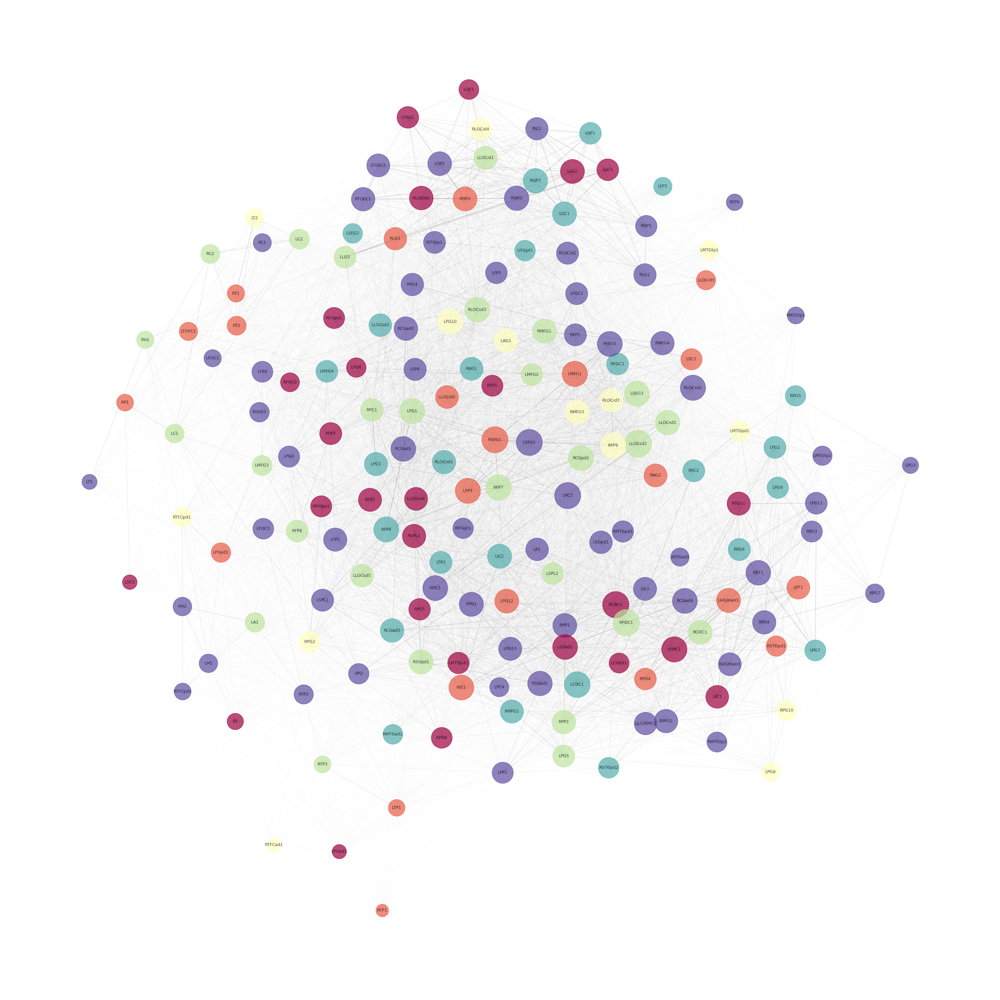

In [56]:
# Standard Network graph with nodes in proportion to Graph degrees
plt.figure(figsize=(30,30))
edgewidth = [ d['weight'] for (u,v,d) in G.edges(data=True)]
pos = nx.spring_layout(G, scale=5)
nx.draw(G, pos, with_labels=True, width=np.power(edgewidth, 2), edge_color='grey', node_size=normstrengthlist*20000,
        labels=Convert(lineList), font_color='black', node_color=colornumbs/10, cmap=plt.cm.Spectral, alpha=0.7, font_size=9)
#plt.savefig('network.jpeg')

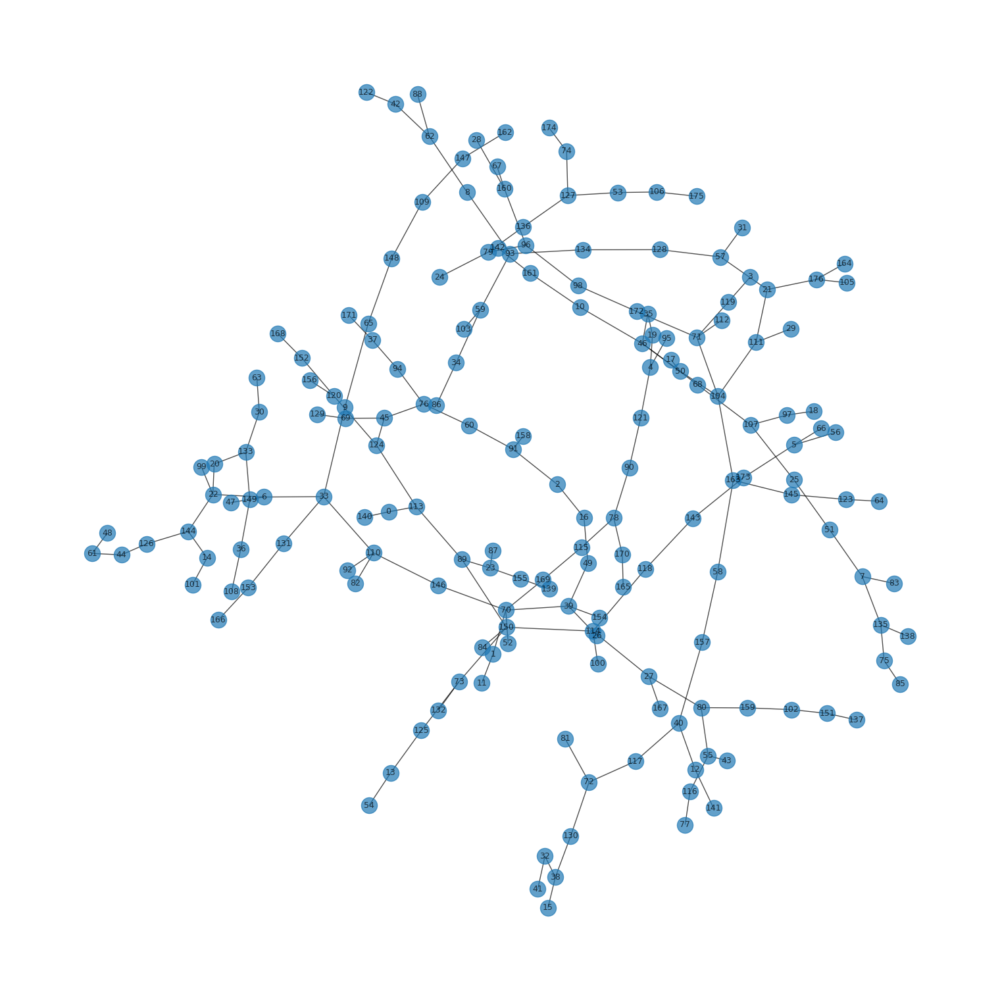

In [57]:
# Let's visualise the Minimum Spanning Tree
plt.figure(figsize=(15,15))
nx.draw(GMST, with_labels=True, alpha=0.7, font_size=9)

* Detail!
For the sake of a less overwhelming plot, we will work with the st50G graph for the CircosPlot.

TypeError: ignored

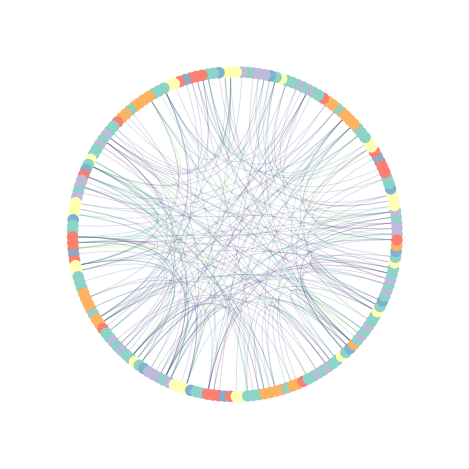

In [72]:
# First let's just add some attributes so that it becomes more interesting

from nxviz import CircosPlot

nx.set_node_attributes(st50G, dict(st50G.degree(weight='weight')), 'strength')

nx.set_node_attributes(st50G, Convert(lineList), 'area')

nx.set_node_attributes(st50G, Convert(colorlist), 'color')

nx.set_node_attributes(st50G, Convert(sublist), 'subnet')

#edgecolors = {(e1, e2): int((weight+1)**3) for e1, e2, weight in st50G.edges(data='weight')}

# Then add them as attributes to the graph
#nx.set_edge_attributes(st50G, edgecolors, 'edgecolor')

G_distance_dict2 = {(e1, e2): 1 / abs(weight) for e1, e2, weight in st50G.edges(data='weight')}

# Then add them as attributes to the graph
nx.set_edge_attributes(st50G, G_distance_dict2, 'distance')


st50GRL = nx.relabel_nodes(st50G, {i: lineList[i] for i in range(len(lineList))})

# CircosPlot
circ = CircosPlot(st50GRL,
                  edge_color='weight', edge_width='weight', node_color='subnet',
                  nodeprops={"radius": 2})

circ.draw()

circ.sm.colorbar.remove()
labels_networks = sorted(list(set([list(circ.graph.nodes.values())[n][circ.node_color] for n in np.arange(len(circ.nodes))])))

plt.legend(handles=circ.legend_handles,
           title="Subnetwork",
           ncol=6,
           borderpad=1,
           shadow=True,
           fancybox=True,
           loc='best',
           fontsize=10,
           labels= labels_networks)

plt.show()

In [73]:
# How to get node positions according to https://stackoverflow.com/questions/43541376/how-to-draw-communities-with-networkx
def community_layout(g, partition):
    """
    Compute the layout for a modular graph.


    Arguments:
    ----------
    g -- networkx.Graph or networkx.DiGraph instance
        graph to plot

    partition -- dict mapping int node -> int community
        graph partitions


    Returns:
    --------
    pos -- dict mapping int node -> (float x, float y)
        node positions

    """

    pos_communities = _position_communities(g, partition, scale=3.)

    pos_nodes = _position_nodes(g, partition, scale=1.)

    # combine positions
    pos = dict()
    for node in g.nodes():
        pos[node] = pos_communities[node] + pos_nodes[node]

    return pos

def _position_communities(g, partition, **kwargs):

    # create a weighted graph, in which each node corresponds to a community,
    # and each edge weight to the number of edges between communities
    between_community_edges = _find_between_community_edges(g, partition)

    communities = set(partition.values())
    hypergraph = nx.DiGraph()
    hypergraph.add_nodes_from(communities)
    for (ci, cj), edges in between_community_edges.items():
        hypergraph.add_edge(ci, cj, weight=len(edges))

    # find layout for communities
    pos_communities = nx.spring_layout(hypergraph, **kwargs)

    # set node positions to position of community
    pos = dict()
    for node, community in partition.items():
        pos[node] = pos_communities[community]

    return pos

def _find_between_community_edges(g, partition):

    edges = dict()

    for (ni, nj) in g.edges():
        ci = partition[ni]
        cj = partition[nj]

        if ci != cj:
            try:
                edges[(ci, cj)] += [(ni, nj)]
            except KeyError:
                edges[(ci, cj)] = [(ni, nj)]

    return edges

def _position_nodes(g, partition, **kwargs):
    """
    Positions nodes within communities.
    """

    communities = dict()
    for node, community in partition.items():
        try:
            communities[community] += [node]
        except KeyError:
            communities[community] = [node]

    pos = dict()
    for ci, nodes in communities.items():
        subgraph = g.subgraph(nodes)
        pos_subgraph = nx.spring_layout(subgraph, **kwargs)
        pos.update(pos_subgraph)

    return pos

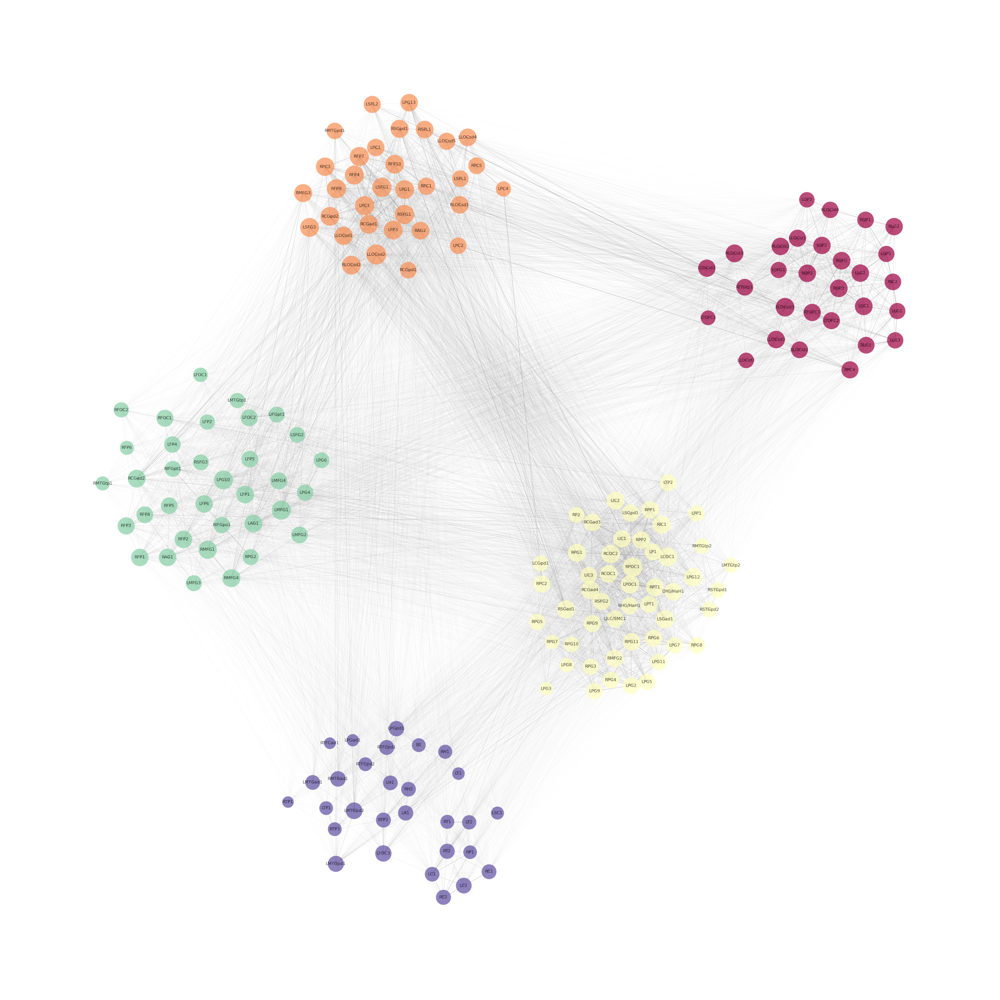

In [74]:
# Visualisation of Communities/Modularity - Run cells 135 and 137 before!
plt.figure(figsize=(25,25))
values = [part.get(node) for node in G.nodes()]
clust=[i*9000 for i in nx.clustering(G, weight='weight').values()]
nx.draw(G, pos=community_layout(G, part), font_size=8, node_size=clust, node_color=values, width=np.power([ d['weight'] for (u,v,d) in G.edges(data=True)],2),
        with_labels=True, labels=Convert(lineList), font_color='black', edge_color='grey', cmap=plt.cm.Spectral, alpha=0.7)

<a id='TDA'></a>

## **4.** Topology & Geometry
#### Moving on to Topology & Geometry metrics.

Here, we will cover a few computations that are being applied in Neuroscience:
- Persistent Homology
- Euler Characteristic and Curvature

#####  Let's start with persistent homology computations:
Persistent homology is a method for computing topological features of a space at different spatial resolutions.
With it, we can track homology cycles across simplicial complexes, and determine whether there were homology classes that "persisted" for a long time (Reference [5]).
The basic idea is summarized in the illustration below.

![TDA2.jpg](attachment:TDA2.jpg)
Figure 3. Topological data analysis. (A) Illustration of simplexes. (B) Representation of simplexes/cliques of different order being formed in the brain across the filtration process. (C) Barcode respective to panel B, representing the filtration across distances (i.e., the inverse of weights in a correlation matrix). Line A represents cycle A in B. H0-2 indicates the homology groups. (H0 = connected components, H1 = one-dimensional holes, H2 = 2-dimensional holes). (D) Circular projection of how the brain would be connected. (E) Persistence diagram (or Birth/Death plot) obtained from real rsfMRI brain data. In this plot, it is also possible to identify a phase transition between H1 and H2.

  Using cached gudhi-3.8.0-cp310-cp310-manylinux_2_17_x86_64.manylinux2014_x86_64.whl (3.0 MB)


<Axes: title={'center': 'Persistence barcode'}>

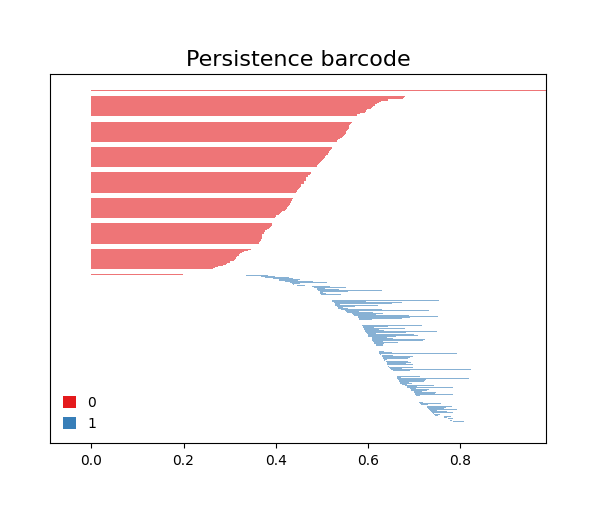

In [78]:
# Computation of persistence barcode  (http://gudhi.gforge.inria.fr/python/latest/persistence_graphical_tools_user.html)
!pip install gudhi
import gudhi
# Converting to distance matrix
mattop = 1 - matrix

# Computing and plotting barcode
rips_complex = gudhi.RipsComplex(distance_matrix=mattop, max_edge_length=1)
simplex_tree = rips_complex.create_simplex_tree(max_dimension=2)
diag = simplex_tree.persistence()
gudhi.plot_persistence_barcode(diag, legend=True, max_intervals=0)

Text(0, 0.5, 'Death')

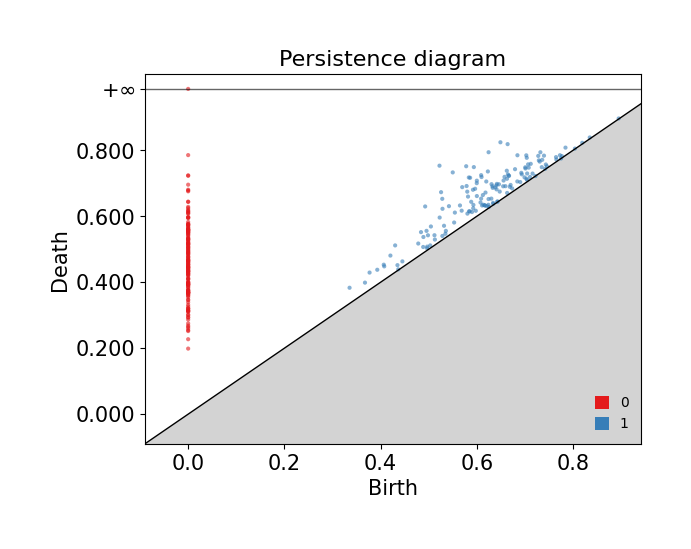

In [79]:
# Persistence Diagram
gudhi.plot_persistence_diagram(diag, legend=True, max_intervals=0)
plt.tick_params(axis='both', labelsize=15)
plt.xlabel('Birth', fontsize=15)
plt.ylabel('Death', fontsize=15)

<Axes: title={'center': 'Persistence density'}, xlabel='Birth', ylabel='Death'>

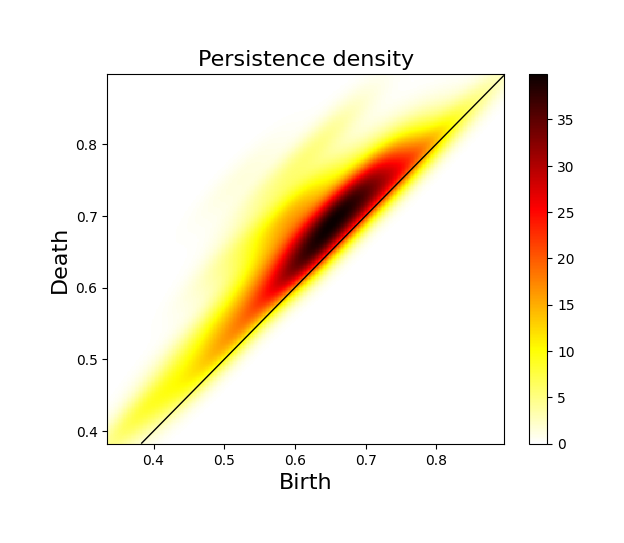

In [80]:
# Persistence density plots
gudhi.plot_persistence_density(diag, dimension=1)

#####  Betti numbers
Another set of topological invariants are the Betti numbers (𝛽). Given that a simplicial complex is a high-dimensional structure, 𝛽𝑘 counts the number of k-dimensional holes in the simplicial complex. These are topological invariants that cor-respond, for each 𝑘≥0, to the number of linearly independent k-dimensional holes in the simplicial complex.

In [82]:
# Import TDA functions
%run "/content/network_TDA_tutorial/Background Scripts/TDA.py"

<Figure size 640x480 with 0 Axes>

In [91]:
def densthr(d, i,DIAGNOSTIC=False):
    """Creating a binarized graph with a specific density

    Parameters
    ---------
    d: float
        density value

    i: numpy matrix
        connectivity matrix

    Returns
    -------
    finaldensity: float
        final density value

    G1: networkx graph
        graph with the specified density

    """

    np.fill_diagonal(i, 0)
    temp = sorted(i.ravel(), reverse=True) # Will flatten it and rank corr values.
    size = len(i)
    cutoff = np.ceil(d*(size*(size-1)))
    tre = temp[int(cutoff)]
    G0 = nx.from_numpy_array(i)
    G0.remove_edges_from(list(nx.selfloop_edges(G0)))
    G1 = nx.from_numpy_array(i)
    for u,v,a in G0.edges(data=True):
        if (a.get('weight')) <= tre:
            G1.remove_edge(u, v)
    finaldensity = nx.density(G1)
    if DIAGNOSTIC == True:
        print(finaldensity)

    return G1

In [92]:
# Compute a sparser graph (10%)
G_d10 = densthr(0.1, matrix)

# Compute Betti number
Betti_k(G_d10, 1)

21

#####  Computation of phase transitions and curvature

One way of connecting the geometry of a continuous surface to its topology is by using local curvature and Euler characteristics. Here, we will compute the network curvature at each node to calculate topological phase transitions in brain networks from a local perspective (Reference [6]). Here we will show the computation for both threshold-based and density-based filtration.

In [106]:

def Graph_thresh(e, i):
    """Creating a binarized graph with a specific threshold

    Parameters
    ----------
    e: int
        threshold value

    i: numpy matrix
        connectivity matrix

    Returns
    -------
    temp: networkx graph

    Notes
    -------
    Returns a graph that maps all elements greater than e to the zero element

    """

    # Notice that we did not normalize the data. If you want to normalize
    # just uncomment here
    # ScdatanGA=np.array(normalize(Aut[i]))

    data = i
    # be careful to always pass copy of data, othewise will change the data as well
    cpdata = (np.copy(np.abs(data)))
    cpdata[(np.copy(np.abs(data))) <= (1-e)] = 0.0

    thresh_graph= nx.from_numpy_array(cpdata[:,:])

    return thresh_graph

In [107]:
def plotEuler_thr(i, maxvalue):
    """Plotting the Euler entropy, i.e. the logarithm of the Euler
    characteristics for a given threshold interval.

    Parameters
    ---------
    i: numpy matrix
        connectivity matrix

    maxvalue: int
        from 0 to 100

    Returns
    -------
    A plot of the Euler entropy based on thr

    """

    # Change to eulerchoice_dens if intended
    plt.plot(np.log(np.abs(Eulerchoice_thr(i, maxvalue, 0))))
    plt.xlabel('Threshold (ε)')
    plt.ylabel('Euler entropy Sχ = ln |χ(ε)|')
    locs, labels = plt.xticks()
    plt.xticks(locs, list(locs/100))
    plt.xlim(0, maxvalue)
    plt.show()



In [108]:
def Eulerchoice_thr(i, maxvalue, k):
    """

    Parameters
    ---------
    i: numpy matrix
        connectivity matrix

    maxvalue: int

    k: int
        euler characteristic=0, total=1,max=2, 3=vertices, 4=edges,
        5=triangles, etc.

    Returns
    -------
    output: Returns a list with  an specific summary metric k for a
    range of thresholds.

    Notes
    -------


    """

    temp = Eulerange_thr(i, maxvalue)
    output = [temp[i][k] for i in range(0, maxvalue)]

    return output


In [114]:
#!/usr/bin/env python3
# -*- coding: utf-8 -*-
"""Topological Data Analysis

This script is a compilation of some topological data analysis tools.

"""

__author__ = 'Fernando Nobrega & Eduarda Centeno & Giulia Moreni'
__contact__ = 'f.nobregasantos@amsterdamumc.nl or e.centeno@amsterdamumc.nl'
__date__ = '2020/05/10'   ### Date it was created
__status__ = 'Production'


####################
# Review History   #
####################


####################
# Libraries        #
####################

# Standard imports
import itertools

# Third party imports
import numpy as np # version 1.18.5
import matplotlib.pyplot as plt # version 3.3.2
import scipy.io # version 1.5.0
from sklearn import preprocessing # version 0.24.1
import networkx as nx # version 2.4
import scipy.special

#############################
# Pre-defined settings      #
#############################
# Notice that some TDA scripts are quite heavy, if you run in a server
# consider using nice command
# niceValue = os.nice(10)

# You can set up the maximum clique size for your analysis bellow.
kmax = 30 # dimensions - max size for the optimized clique algorithm

# Define Functions ----------------------------------------------------

def normalize(matrix):
    """Matrix normalization

    Parameters
    ----------
    matrix: numpy matrix

    Returns
    -------
    X_scale_maxabs: numpy matrix
        rescaled matrix

    """
    # For details in this normalization, see:
    # https://scikit-learn.org/stable/modules/generated/sklearn.preprocessing.MaxAbsScaler.html
    # Scale each feature by its maximum absolute value.
    # This estimator scales and translates each feature individually such
    # that the maximal absolute value of each feature in the training set will be 1.0.
    # It does not shift/center the data, and thus does not destroy any sparsity.


    # This is the data I want to scale
    X_scale = np.copy(matrix)
    # This is the one I can use for the HCP

    max_abs_scaler = preprocessing.MaxAbsScaler()
    X_scale_maxabs = max_abs_scaler.fit_transform(X_scale)

    return X_scale_maxabs #X_train_minmax


def max_cliques(N, k):
    """

    Parameters
    ----------
    N: number of nodes of your network

    k: maximum size of the cliques

    Returns
    -------
    mclq: total number of possible cliques with size from 0 to k

    OBS:
    ---
    The clique algorithm is time consuming (NP) large and dense matrices,
    this function is an attempt to deal with it

    """

    mclq = 0
    for i in range(0, k+1):
        # Notice that we sum up to k+1, since Python does not counts
        # the last values in the range.
        mclq += scipy.special.binom(N, i)

    mclq = int(mclq)

    return mclq


def Kmaxcliques(G, kmax=kmax):
    """

    Parameters
    ----------
    G: networkx graph

    kmax: int
        number of dimensions

    Returns
    -------
    C: list with all maximal cliques of the graph G with size up to kmax

    """
    # Depending on the analysis, we can use a timer for the computation
    # start_time = time.time()
    # main()
    Nodes = len(G)

    Cliques = nx.find_cliques(G)
    Limit = max_cliques(Nodes, kmax)
    Cl=[]
    while True:
        try:
            for i in range(0,Limit):
                clq = next(Cliques)
                if len(clq) <= kmax: # IF YOU DON'T WANNA USE KMAX
                                     # JUST COMMENT THIS
                    Cl.append(clq)
        except StopIteration:
            break
    # If not provided, compute maximal cliques
    # if (C is None) : C = nx.find_cliques(G)

    # Sort each clique, make sure it's a tuple
    C = [list(sorted(c)) for c in Cl]

    return C

def Kmax_all_cliques(G, kmax=kmax):
    """"
    Enumerate all cliques to a maximum (fixed) size
    """
    C = Kmaxcliques(G)
    Sk = set()
    for k in range(0, max(len(s) for s in C)) :
        # Get all (k+1)-cliques, i.e. k-simplices, from all max cliques mc in C
        # Notice that we are usning set(c) so that we count each clique only once
        [Sk.add(c) for mc in C for c in (itertools.combinations(mc, k+1))]
        # Check that each simplex is in increasing order
        # assert(all((list(s) == sorted(s)) for s in Sk))
        # Assign an ID to each simplex, in lexicographic order
        # S.append(dict(zip(sorted(Sk), range(0, len(Sk)))))
        # Appending the number of cliques of size k+1
        Cliques = [list(i) for i in Sk]
    return Cliques



def Euler_charac(G, kmax=kmax):
    """

    Parameters
    ----------
    G: networkx graph

    kmax: int
        number of dimensions

    Returns
    -------
    summary:
        A list with a topological summary for the graph G with Euler
        characteristics, tau, and number of cliques for each size
    OBS:
    ---
    This function limits the number of cliques to a maximum kmax

    """

    #start_time = time.time()
    #main()
    Nodes = len(G)

    Cliques = nx.find_cliques(G)
    Limit = max_cliques(Nodes, kmax)
    Cl = []
    while True:
        try:
            for i in range(0,Limit):
                clq = next(Cliques)
                if len(clq) <= kmax: # IF YOU DON'T WANNA USE KMAX,
                                     # JUST COMMENT THIS
                    Cl.append(clq)
        except StopIteration:
            break
    # If not provided, compute maximal cliques
    # if (C is None) : C = nx.find_cliques(G)

    # Sort each clique, make sure it's a tuple
    C = [tuple(sorted(c)) for c in Cl]


    summary = []
    for k in range(0, max(len(s) for s in C)) :
        # Get all (k+1)-cliques, i.e. k-simplices, from all max cliques mc in C
        # Notice that we are usning set(c) so that we count each clique only once
        Sk = set(c for mc in C for c in itertools.combinations(mc, k+1))
        # Check that each simplex is in increasing order
        # assert(all((list(s) == sorted(s)) for s in Sk))
        # Assign an ID to each simplex, in lexicographic order
        # S.append(dict(zip(sorted(Sk), range(0, len(Sk)))))
        # Appending the number of cliques of size k+1
        summary.append(len(Sk))
    tau = sum(summary) # Tau gives the total number of cliques
    kmax = len(summary) # Kmax is the maximum clique size one can find
    ec = 0 # ec is the Euler characteristics
    for i in range(0,len(summary)):
        if i%2 == 0:
                ec += summary[i]
        if i%2 == 1:
                ec += -summary[i]
        #ec+=(-1)**(k % 2)*k
    #print((k))
    summary.insert(0, kmax)
    summary.insert(0, tau)
    summary.insert(0, ec)
    # I want to include new elements after kmax with zero, to say that
    # there are no simplicies with this size, but all the outputs will
    # be lists with the same size
    for i in range(kmax, 30):
        # The first guy is chi, the second is tau, the third is kmax
        summary.insert(kmax+3, 0)

    # The output will be summary starting with EC, tau, kmax, clique_0,
    # Clique_1,Clique_2, Clique_3, and so on...

    return summary


def Graph_thresh(e, i):
    """Creating a binarized graph with a specific threshold

    Parameters
    ----------
    e: int
        threshold value

    i: numpy matrix
        connectivity matrix

    Returns
    -------
    temp: networkx graph

    Notes
    -------
    Returns a graph that maps all elements greater than e to the zero element

    """

    # Notice that we did not normalize the data. If you want to normalize
    # just uncomment here
    # ScdatanGA=np.array(normalize(Aut[i]))

    data = i
    # be careful to always pass copy of data, othewise will change the data as well
    cpdata = (np.copy(np.abs(data)))
    cpdata[(np.copy(np.abs(data))) <= (1-e)] = 0.0

    thresh_graph= nx.from_numpy_array(cpdata[:,:])

    return thresh_graph


def densthr(d, i,DIAGNOSTIC=False):
    """Creating a binarized graph with a specific density

    Parameters
    ---------
    d: float
        density value

    i: numpy matrix
        connectivity matrix

    Returns
    -------
    finaldensity: float
        final density value

    G1: networkx graph
        graph with the specified density

    """

    np.fill_diagonal(i, 0)
    temp = sorted(i.ravel(), reverse=True) # Will flatten it and rank corr values.
    size = len(i)
    cutoff = np.ceil(d*(size*(size-1)))
    tre = temp[int(cutoff)]
    G0 = nx.from_numpy_array(i)
    G0.remove_edges_from(list(nx.selfloop_edges(G0)))
    G1 = nx.from_numpy_array(i)
    for u,v,a in G0.edges(data=True):
        if (a.get('weight')) <= tre:
            G1.remove_edge(u, v)
    finaldensity = nx.density(G1)
    if DIAGNOSTIC == True:
        print(finaldensity)

    return G1


def Eulerange_thr(i, maxvalue):
    """
    computes the Euler Characteristic and the respective summary metrics
    for a range of thresholds.

    Parameters
    ---------
    i: numpy matrix
        connectivity matrix

    maxvalue: int

    Returns
    -------
    Ec: List with Euler characteristic for a list of thresholds

    Notes
    -------
    Filtration process based on thresh
    Notice that we sliced the network in 1/100 steps. We can always do higher or
    lower steps if required.

    """

    Ec = []
    for j in range(0, maxvalue):
        Ec.append(Euler_charac(Graph_thresh(j/100, i)))

    return Ec


def Eulerange_dens(i, maxvalue):
    """
    Computes the Euler Characteristic and the respective summary metrics
    for a range of densities.


    Parameters
    ---------
    i: numpy matrix
        connectivity matrix

    maxvalue: int

    Returns
    -------
    Ec: List with the Euler characteristic for a list of densities

    Notes
    -------
    Filtration process based on density
    Notice that we sliced the network in 1/100 steps.


    """

    Ec = []
    for j in range(0, maxvalue):
        Ec.append(Euler_charac(densthr(j/100, i)))

    return Ec


def Eulerchoice_thr(i, maxvalue, k):
    """

    Parameters
    ---------
    i: numpy matrix
        connectivity matrix

    maxvalue: int

    k: int
        euler characteristic=0, total=1,max=2, 3=vertices, 4=edges,
        5=triangles, etc.

    Returns
    -------
    output: Returns a list with  an specific summary metric k for a
    range of thresholds.

    Notes
    -------


    """

    temp = Eulerange_thr(i, maxvalue)
    output = [temp[i][k] for i in range(0, maxvalue)]

    return output


def Eulerchoice_dens(i, maxvalue, k):
    """

    Parameters
    ---------
    i: numpy matrix
        connectivity matrix

    maxvalue: int

    k: int
        euler characteristic=0, total=1, max=2, 3=vertices, 4=edges,
        5=triangles, etc.

    Returns
    -------
    output: Returns a list with  an specific summary metric k for a
    range of densities.

    Notes
    -------


    """

    temp = Eulerange_dens(i, maxvalue)
    output = [temp[i][k] for i in range(0, maxvalue)]

    return output


def plotEuler_thr(i, maxvalue):
    """Plotting the Euler entropy, i.e. the logarithm of the Euler
    characteristics for a given threshold interval.

    Parameters
    ---------
    i: numpy matrix
        connectivity matrix

    maxvalue: int
        from 0 to 100

    Returns
    -------
    A plot of the Euler entropy based on thr

    """

    # Change to eulerchoice_dens if intended
    plt.plot(np.log(np.abs(Eulerchoice_thr(i, maxvalue, 0))))
    plt.xlabel('Threshold (ε)')
    plt.ylabel('Euler entropy Sχ = ln |χ(ε)|')
    locs, labels = plt.xticks()
    plt.xticks(locs, list(locs/100))
    plt.xlim(0, maxvalue)
    plt.show()


def plotEuler_den(i, maxvalue):
    """Plotting the Euler entropy, i.e. the logarithm of the Euler
    characteristics for a given density interval.

    Parameters
    ---------
    i: numpy matrix
        connectivity matrix

    maxvalue: int
        from 0 to 100

    Returns
    -------
    A plot of the Euler entropy based on density

    """

    # Change to eulerchoice_dens if intended
    plt.plot(np.log(np.abs(Eulerchoice_dens(i, maxvalue, 0))))
    plt.xlabel('Density (d)')
    plt.ylabel('Euler entropy Sχ = ln |χ(d)|')
    locs, labels = plt.xticks()
    plt.xticks(locs, list(locs/100))
    plt.xlim(0, maxvalue)
    plt.show()



def Curv_density(d, i, verbose=False):
    """Compute nodal curvature (Knill's curvature) based on density

    Parameters
    ---------
    d: float
        density value

    i: numpy matrix
        connectivity matrix

    Returns
    -------
    fden: float
        final density value for the graph

    curv: numpy array
        array with curvature values

    """

    def DIAGNOSTIC(*params) :
        if verbose : print(*params)
    DIAGNOSTIC('This function run over all nodes and computes the curvature of the nodes in the graph' )

    # This is the initial Graph
    #fden,
    G_den = densthr(d,i)

    # Enumerating all cliques of G up to a certain size
    temp = Kmax_all_cliques(G_den)

    # This lista is a vector V where each v_i is the number of cliques of size i
    lista = []

    # We suppose that the size of the cliques are smaller than 50, so we create an
    # empty list of size 50 for the lista
    for i in G_den.nodes():
        # We start with empty scores for the curvature
        # creating a list of lists for each node - all empty for the
        # scores for each size for each node
        lista.append([0] * 50)

    DIAGNOSTIC('These are all cliques of the Network:')
    # THIS WILL PRINT ALL THE CLIQUES
    DIAGNOSTIC(temp)

    DIAGNOSTIC('We now print the curvature/clique score of each node in the network')

    # Now we run over all nodes checking if the node belongs to one clique or another
    Sc = []
    for node in G_den.nodes(): # now we run the script for each clique
        score = 0 # This is the initial score of the node in the participation rank
        for clique in temp:
            # Checking the size of the clique
            k = len(clique)
            # If this node is in the clique, we update the curvature
            if node in clique:
                score += 1 # If the node is in the clique raises the score
                # Increases the curvature score for a size k with a
                # different weight due to Gauss-Bonnet theorem - is k-1 since
                # len>0 and python starts from zero.
                lista[node][k-1] += (-1)**(k+1)*1/k
        Sc.append(score)

        DIAGNOSTIC('The node '+str(node)+' has score ='+str(score))

    total=[]
    for elements in lista:
        # Summing the participation in all sizes, so that we can compute the
        # curvature (TOTAL IS ACTUALLY THE CURVATURE - WITHOUT NORMALIZATION)
        total.append(sum(elements)) # This is good if one wants to normalize by the maximum
    DIAGNOSTIC(total)

    nor = sum(total) ####!!! not being used //REMOVE ?
    nor2 = max(total) ####!!! not being used //REMOVE ?
    # nt is normalized by the sum
    #nt2 is normalized by the max"
    nt = []
    nt2 = []

    # I just removed where one could find division by zero
    #for i in range(0,len(total)):
    #    nt.append(total[i]/nor)
    #    nt2.append(total[i]/nor2)
    most = np.argsort(-np.array(total))#

    #def showrank():
    for i in most:
            DIAGNOSTIC('the node ' + str(i)+ ' is in '+ str(total[i])+ ' cliques')
    #    return
    #DIAGNOSTIC(showrank())

    DIAGNOSTIC('These are the most important nodes ranked according to the total clique score')
    DIAGNOSTIC(most)
    DIAGNOSTIC('These is the array nt')

    DIAGNOSTIC(nt)
    DIAGNOSTIC('These is the array nt2')

    DIAGNOSTIC(nt2)
    DIAGNOSTIC('These is the array lista')

    DIAGNOSTIC(lista)
    DIAGNOSTIC('The output is one vector normalizing the value from the maximum')
    #vector=10000*np.array(nt)
    # nor2 is the maximum- The output nt2 is in percentage -
    # That means the max get 100 and the rest bet 0-100

    # curv gives the curvature  - put Sc instead of curv to get that
    # the particiaption rank - notice that you can normalize in many ways"
    curv = []
    for i in range(0, len(lista)):
        # Summing up for a fixed node all the curvature scores gives the
        # curvature of the nodes
        curv.append(sum(lista[i]))

    curv = np.array(curv)
    # Now, the curvature is not normalized!!!
    return curv#fden, curv


def Curv_thr(e, i, verbose=False):
    """Compute nodal curvature based on threshold

    Parameters
    ---------
    e: float
        threshold value

    i: numpy matrix
        connectivity matrix

    Returns
    -------
    curv: numpy array
        array with curvature values

    """

    def DIAGNOSTIC(*params):
        if verbose : print(*params)
    DIAGNOSTIC('This function run over all nodes and computes the curvature of the nodes in the graph' )

    # This is the initial Graph
    G_thr = Graph_thresh(e,i)
    temp = Kmax_all_cliques(G_thr)

    # This lista is a vector V where each v_i is the number of cliques of size i
    lista = []

    # We suppose that the size of the cliques are smaller than 20,
    # so we create an empty list of size 20 for the lista
    for i in G_thr.nodes():
        lista.append([0] * 50) # creating a list of lists for each node -
        # all empty for the scores for each size for each node

    DIAGNOSTIC('These are all cliques of the Network:')
    DIAGNOSTIC(temp)
    DIAGNOSTIC('We now print the curvature/clique score of each node in the network')

    # Now we run over all nodes checking if the node belongs to one clique or another
    Sc = []
    for node in G_thr.nodes(): # now we process for each clique
        score = 0 # This is the initial score of the node in the participation rank
        for clique in temp:
            k = len(clique)
            if node in clique:
                score += 1 # If the node is in the clique raises the score
                lista[node][k-1] += (-1)**(k+1)*1/k # Increases the curvature score
                                                    #  for a size k with a different
                                                    # weight due to Gauss-Bonnet theorem
        Sc.append(score)

        DIAGNOSTIC('The node '+str(node)+' has score ='+str(score))

    total=[]
    for elements in lista:
        total.append(sum(elements)) # This is good if one wants to normalize by the maximum
    DIAGNOSTIC(total)

    nor = sum(total) #### NOTICE THAT nor AND nor2 IS NOT BEING USED
    #                   - HOWEVER, IF ONES DECIDES FOR NORMALIZATION-
    #                   SHOULD TAKE THIS INTO ACCOUNT
    nor2 = max(total)
    # nt is normalized by the sum
    #nt2 is normalized by the max"
    nt = []
    nt2 = []

    # I just removed where one could find division by zero
    #for i in range(0,len(total)):
    #    nt.append(total[i]/nor)
    #    nt2.append(total[i]/nor2)
    most=np.argsort(-np.array(total))#

    #def showrank():
    for i in most:
            DIAGNOSTIC('the node ' + str(i)+ ' is in '+ str(total[i])+ ' cliques')
    #    return
    #DIAGNOSTIC(showrank())

    DIAGNOSTIC('These are the most important nodes ranked according to the total clique score')
    DIAGNOSTIC(most)
    DIAGNOSTIC('These is the array nt')

    DIAGNOSTIC(nt)
    DIAGNOSTIC('These is the array nt2')

    DIAGNOSTIC(nt2)
    DIAGNOSTIC('These is the array lista')

    DIAGNOSTIC(lista)
    DIAGNOSTIC('The output is one vector normalizing the value from the maximum')
    #vector=10000*np.array(nt)
    # nor2 is the maximum- The output nt2 is in percentage -
    # That means the max get 100 and the rest bet 0-100

    # curv gives the curvature  - put Sc instead of curv to get that the
    # particiaption rank - notice that you can normalize in many ways
    curv = []
    for i in range(0, len(lista)):
        curv.append(sum(lista[i]))# Summing up for a fixed node all the
                                  #  curvature scores gives the curvature of the nodes
    curv = np.array(curv)

    return curv


def SaveEuler(individual, name, tresh):
    """Save Euler results

    Parameters
    ---------
    individual: numpy matrix
        connectivity matrix

    name: str
        file name

    tresh: float
        threshold value

    Returns
    -------
    Files with results

    """

    values = (Eulerchoice_thr(individual,tresh,0)) # change to eulerchoice_dens if intended
    with open(name, 'w') as output:
        output.write(str(values))



def Participation_in_cliques(d, i, cl, verbose=False):
    """
    Returns a list with the participation rank in cliques of a fixed size
    inputs:
    d: density
    i: matrix
    cl: clique size
    """
    def DIAGNOSTIC(*params) :
        if verbose : print(*params)
        return

    # I want that the output is a vector analogous with the previous one,
    # but for a fixed k, not for all k
    # COMPUTING THE CLIQUES
    G = densthr(d,i)
    temp = Kmax_all_cliques(G)
    DIAGNOSTIC('These are all cliques')
    DIAGNOSTIC(temp)
    "This lista is a vector V where each v_i is the number of cliques of size i"
    lista = []
    # We suppose that the size of the cliques are smaller than 50,
    # so we create an empty list of size 50 for the lista
    for i in G.nodes():
        lista.append([0] * 50)
    #Creating a list of lists - for the particiaption scores of the nodes
    "Now we run over all nodes checking if the node is in one clique or another"
    for node in G.nodes(): # now I have to do the process for is in clique
        score = 0 # This is the score of the node
        # running over all nodes in G
        for clique in temp:
            #running over all cliques enumerated before
            k = len(clique)
            #checking whether there is a node in the clique of size k
            if node in clique:
                #INCLUDING THE SCORE FOR THE CLIQUE
                score += 1
                lista[node][k-1] += 1
       # print('the node '+str(node)+' has score ='+str(score))
    total = []
    for elements in lista:
        total.append(sum(elements))
    DIAGNOSTIC('This is the number of cliques each node is participating in')
    DIAGNOSTIC(total)
    DIAGNOSTIC(np.sum(total))
    nor = sum(total)
    nt = []
    for i in range(0,len(total)):
        nt.append(total[i]/nor)

    klist = []
    DIAGNOSTIC('Now lets plot the number of k-cliques each number is participating in')
    for i in G.nodes():
        klist.append(lista[i][cl-1])
        DIAGNOSTIC('the node '+str(i)+ ' has '+ str(cl) + ' - score =' + str(lista[i][cl-1]))

    mostk = np.argsort(-np.array(klist))


    DIAGNOSTIC('These are the most important nodes ranked according to the k-clique score')

    DIAGNOSTIC(mostk)
    for i in mostk:
            DIAGNOSTIC('the node ' +str(i)+ ' is in '+ str(klist[i])+ ' ' +str(cl)+ '-cliques')
    DIAGNOSTIC(klist)


    maxk = max(klist)
    totk = sum(klist)
    # We can do several choices on the particiaption rank: here we
    # choose the percentage of all k-cliques
    return np.nan_to_num(100*np.array(klist)/totk)

def Betti_k(G, K_input, verbose=False):
    """#Function to compute the desired Betti number of a network

    Parameters
    ----------
    Argument1: G is a network. It is in the shape of a network graph of
               the library networkx G.graph()
    Argument2: K_input--> insert 1 if you want to compute Betti-1, 2 for
               Betti-2 etc.

    Returns
    -------
    out: value of the desired Betti number.

    """
    def DIAGNOSTIC(*params): # If verbose is True it will print all the DIAGNOSTIC
        if verbose:
            print(*params)

    DIAGNOSTIC("Nodes in G: ", G.nodes())
    DIAGNOSTIC("Edges in G: ", G.edges())
    DIAGNOSTIC("Number of nodes: {}, edges: {}".format(G.number_of_nodes(), G.number_of_edges()))

    # 1. Prepare maximal cliques

    # compute maximal cliques

    C = nx.find_cliques(G) # C now is the operator "find clique"
                           # (to do the list I should do list(nx.find_cliques(G)))

    #Create list C with all the cliques
    #Sort each clique, convert it from list to tuple
    C = [tuple(sorted(c)) for c in C]
    DIAGNOSTIC("List with all maximal simplex C:",C)
    DIAGNOSTIC("Number of maximal cliques: %i"%(len(C)))

    # 2. Enumerate all simplices

    S = [] #List of dictionaries
    # S[k] is the dictionary which contain all k-simplices
    #S[k].keys() are simplex s (s is one of the k-simplex of the dictionary S[k])
    # S[k].values() are the ID of simplex s
    DIAGNOSTIC("I start the loop where I create the required Sk to then compute betti. Sk is a list with the k-simplex")
    #I set the range for the following loop
    if K_input==0:
        ini = 0
        fin = 2
    else:
        ini = K_input-1
        fin = K_input+2

    for k in range(ini,fin) : # k has 2 values for betti_0 and 3 values for betti1_2_3

        Sk = sorted(set(c for mc in C for c in itertools.combinations(mc, k+1)))

        DIAGNOSTIC("list of %i-simplex S%i:"%(k,k), Sk)
        # Check that each simplex is in increasing order
        assert(all((list(s) == sorted(s)) for s in Sk))
        # Assign an ID to each simplex, in order
        S.append(dict(zip(Sk, range(0, len(Sk))))) # zip(Sk,range()) is
                                                   # an object (composed by tuples)
                                                   # where each element of Sk is
                                                   # associated to a number.
                                                   # I then from the zip object
                                                   # create the dictionary
                                                   # where the key is the Sk element
                                                   # and the value the number
                                                   # I put this dictionary in
                                                   # the S list (list of dictionary)
        DIAGNOSTIC("Number of %i-simplices: "%(k),len(Sk))
    DIAGNOSTIC("S dictionary",S)
    # The cliques are redundant now
    del C

    # 3. Construct the boundary operator

    # Boundary Matrix
    D = [None, None] # List with the two different k-boundary operators

    if K_input==0:
        # D[0] is the zero matrix
        D[0]=(np.zeros((1, G.number_of_nodes())))# I create a matrix of size (1,#nodes)

    for k in range(1, len(S)):

        # I set the index of D[] and the number of nodes in each group for the combinatory part
        if K_input==0:
            index = k
            b = k
        else:
            index = k-1
            b = k+(K_input-1)

        D[index] = np.zeros( (len(S[k-1]), len(S[k])) ) # I create a matrix of size
                                                        # (len(S[k-1]), len(S[k])

        for (ks, j) in S[k].items() :

            a = sorted(itertools.combinations(ks, b))
            #print("a",a)
            # Indices of all (k-1)-subsimplices s of the k-simplex ks
            # S is a list of dictionary with k different size
            I = [S[k-1][s] for s in sorted(itertools.combinations(ks, b))]
            #print("I",I)

            for i in range(0,len(I)):
                D[index][I[i]][j] = (-1)**(i)

        if D[index].shape[1]==0:
            DIAGNOSTIC("I can't create matrix D because I don't have the needed k-simplex")

        DIAGNOSTIC("Boundary matrix:")
        DIAGNOSTIC("D",D[index])

    DIAGNOSTIC("D_{} has shape {}".format(K_input, D[0].shape))
    DIAGNOSTIC("D_{} has shape {}".format(K_input+1, D[1].shape))
    # The simplices are redundant now
    del S

    # 4. Compute rank and dimker of the boundary operators

    # dim(Im)=Rank and dim(ker)=V-rank
    rank = [0 if d.shape[1]==0 else np.linalg.matrix_rank(d) for d in D] #dim(Im)
    ker = [(d.shape[1] - rank[n]) for (n, d) in enumerate(D)] #V - rank = dim(ker) ,rank=dim(Im)

    #The boundary operators are redundant now
    del D
    DIAGNOSTIC("ker:", ker)
    DIAGNOSTIC("rank:", rank)

    # 5. Compute the Betti number

    # Betti number
    DIAGNOSTIC("Betti= ker[0]-rank[1]")
    B=ker[0]-rank[1]
    DIAGNOSTIC("End of computation\nBetti %i is:"%K_input,B)
    return B

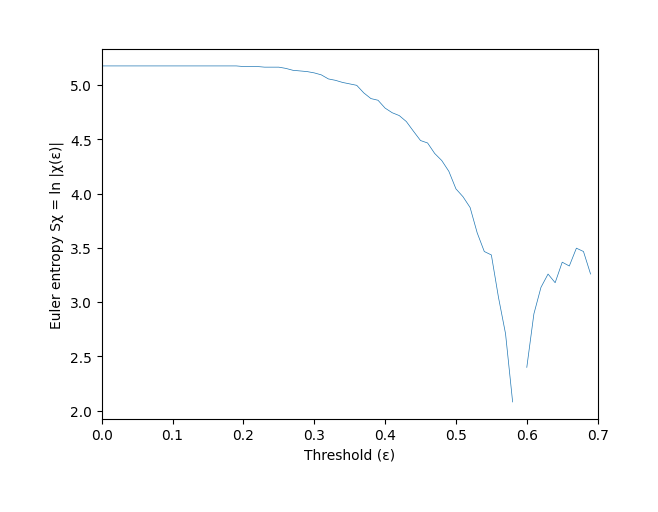

In [115]:
# Euler entropy (Sχ = ln|χ|) as a function of the correlation threshold level.
plotEuler_thr(matrix, 70)

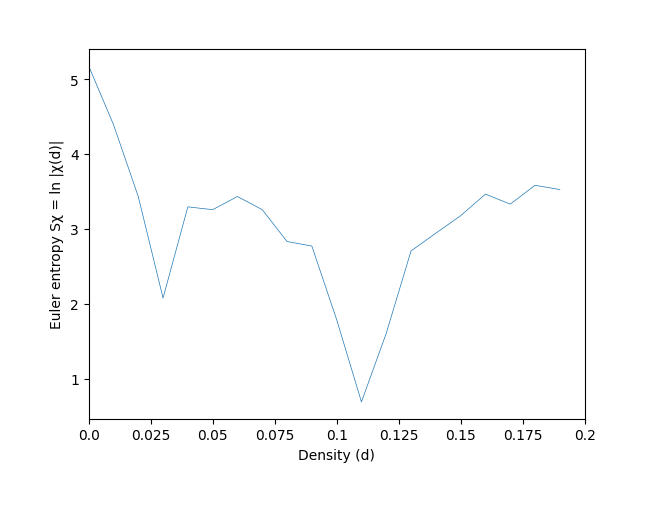

In [116]:
# Euler entropy (Sχ = ln|χ|) as a function of the correlation density level.
plotEuler_den(matrix, 20)

#####  Now, we can obtain the value of curvature for each node at a specific threshold, and then save as a dict with the region name abbreviations.

In [117]:
# Obtaining the value of curvature for each node at a specific threshold and creating a dictionary with brain region names.
curvalues = Curv_thr(i=matrix, e=0.7)
dict(zip(lineList, curvalues))

{'LLOCid1': -0.03524531024556926,
 'LLOCsd1': 0.0682539682539604,
 'RPC1': -0.10000000000000125,
 'LIC1': -0.010281385281718652,
 'LPG1': 0.08015873015870628,
 'RPC2': -0.41666666666666696,
 'RAG1': -0.3333333333333357,
 'LPG2': -0.2059523809523871,
 'LMTGpd1': -0.5833333333333335,
 'RFP1': -0.1500000000000008,
 'RPG1': -0.8416666666666943,
 'RAG2': -0.05714285714286976,
 'RP1': -0.25,
 'LLOCid2': -0.4666666666666679,
 'RPG2': -0.3333333333333335,
 'RT1': 0.08333333333333326,
 'LPC1': -0.25714285714285084,
 'LIC2': -0.2202380952381393,
 'LPG3': 0.16666666666666682,
 'RCGad1': -0.028571428571423807,
 'LFP1': -0.26666666666666694,
 'LPOC1': -0.0023088023097158905,
 'RFP2': -0.31666666666666954,
 'RLOCid1': -0.023737373737592382,
 'LPGad1': 1.0,
 'RPG3': -0.0416666666666623,
 'RCGpd1': -0.5000000000000002,
 'RSPL1': -0.08333333333333237,
 'RTP1': 1.0,
 'LSGpd1': -0.1500000000000008,
 'LPG4': -0.19999999999999996,
 'RCOC1': -0.0007215007225226666,
 'LT1': -0.33333333333333337,
 'RMFG1': 0.

Text(0, 0.5, 'Counts')

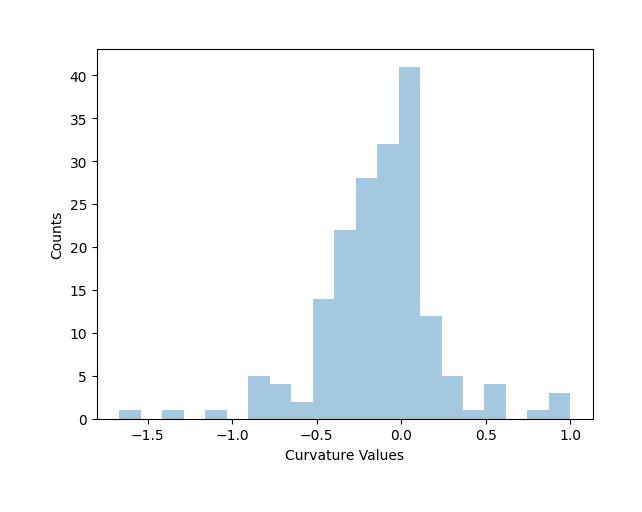

In [118]:
# Histogram for curvature distribution at a specific threshold.
sns.distplot(curvalues, kde=False, norm_hist=False)
plt.xlabel('Curvature Values')
plt.ylabel('Counts')

In [119]:
# Obtaining the value of curvature for each node at a specific density and creating a dictionary with brain region names.
curvals_den = Curv_density(i=matrix, d=0.15)
#dict(zip(lineList, curvals_den))

Text(0, 0.5, 'Counts')

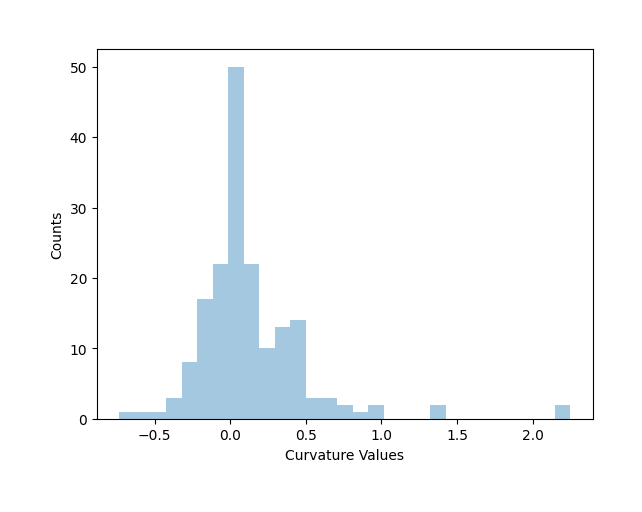

In [120]:
# Histogram for curvature distribution at a specific density.
sns.distplot(curvals_den, kde=False, norm_hist=False)
plt.xlabel('Curvature Values')
plt.ylabel('Counts')

In [122]:
<a id='references'></a>

## **5.** References

[1] Brown JA, Rudie JD, Bandrowski A, Van Horn JD, Bookheimer SY. The UCLA multimodal connectivity database: a web-based platform for brain connectivity matrix sharing and analysis. Front Neuroinform. 2012;6:28. doi: 10.3389/fninf.2012.00028.

[2] Biswal BB, Mennes M, Zuo XN, Gohel S, Kelly C, Smith SM, et al. Toward discovery science of human brain function. Proc Natl Acad Sci U S A. 2010;107(10):4734-9. doi: 10.1073/pnas.0911855107.

[3] Fornito A, Zalesky A, Bullmore E. Fundamentals of brain network analysis. 1st ed. San Diego: Academic Press; 2016.

[4] Hagberg A, Swart P, S Chult D, editors. Exploring network structure, dynamics, and function using NetworkX. Proceedings of the 7th Python in Science conference (SciPy 2008); 2008 Aug 19-24; Pasadena, USA.

[5] Bassett DS, Sporns O. Network neuroscience. Nat Neurosci. 2017;20(3):353. doi: 10.1038/nn.4502.

[6] Santos FAN, Raposo EP, Coutinho-Filho MD, Copelli M, Stam CJ, Douw L. Topological phase transitions in functional brain networks. Phys Rev E. 2019;100(3-1):032414. doi: 10.1103/PhysRevE.100.032414.

SyntaxError: ignored

<a id='acknowledgements'></a>

## **6.** Acknowledgements

The 1000_Functional_Connectomes dataset was downloaded from the [The UCLA multimodal connectivity database](http://umcd.humanconnectomeproject.org/).